# Описание проекта.

Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.

Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.

Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

# Описание данных.

Файл moscow_places.csv:
- name — название заведения;
- address — адрес заведения;
- category — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- hours — информация о днях и часах работы;
- lat — широта географической точки, в которой находится заведение;
- lng — долгота географической точки, в которой находится заведение;
- rating — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- price — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- avg_bill — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
  
  
- «Средний счёт: 1000–1500 ₽»;
- «Цена чашки капучино: 130–220 ₽»;
- «Цена бокала пива: 400–600 ₽».
- и так далее;
- middle_avg_bill — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:

    
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- middle_coffee_cup — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
  
- Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
- Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
- Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- chain — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):


- 0 — заведение не является сетевым
- 1 — заведение является сетевым
- district — административный район, в котором находится заведение, например Центральный административный округ;
- seats — количество посадочных мест.

## Предобработка данных.

Импортируем основные библиотеки для начала работы. Загрузим датасет с помощью конструкции try/except.

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
from matplotlib import pyplot as plt
import plotly.express as px
import plotly.graph_objects as go

from folium import Marker, Map, Choropleth
from folium.plugins import MarkerCluster
import json

In [2]:
try:
    data = pd.read_csv('/datasets/moscow_places.csv')
except:
    data = pd.read_csv('https://code.s3.yandex.net/datasets/moscow_places.csv')

In [3]:
pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', 1)

Воспользуемся методом info и изучим тип данных каждого столбца датасета.

In [4]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


В данном датасете представленно 8406 строк с наименованиями заведений общепита г. Москвы.

Произведем предобработку данных.

In [5]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


Проверим датасет на наличие дубликатов методом duplicated().sum()

In [6]:
data.duplicated().sum()

0

Выполним поиск неявнных дубликатов с помощью метода duplicated и зададим в параметр subset столбцы name и address.

In [7]:
data[~data.duplicated(subset=['name','address'])]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8401,Суши Мания,кафе,"Москва, Профсоюзная улица, 56",Юго-Западный административный округ,"ежедневно, 09:00–02:00",55.670021,37.552480,4.4,NaN,NaN,NaN,NaN,0,86.0
8402,Миславнес,кафе,"Москва, Пролетарский проспект, 19, корп. 1",Южный административный округ,"ежедневно, 08:00–22:00",55.640875,37.656553,4.8,NaN,NaN,NaN,NaN,0,150.0
8403,Самовар,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648859,37.743219,3.9,NaN,Средний счёт:от 150 ₽,150.0,NaN,0,150.0
8404,Чайхана Sabr,кафе,"Москва, Люблинская улица, 112А, стр. 1",Юго-Восточный административный округ,"ежедневно, круглосуточно",55.648849,37.743222,4.2,NaN,NaN,NaN,NaN,1,150.0


Неявных дубликатов в датасете также не обнаружено, количество строк после обработки не изменилось - 8406 шт.

Воспользуемся методом isna().sum() и определим количество пропусков в каждом из столбцов датасета.

In [8]:
data.isna().sum()

name                 0   
category             0   
address              0   
district             0   
hours                536 
lat                  0   
lng                  0   
rating               0   
price                5091
avg_bill             4590
middle_avg_bill      5257
middle_coffee_cup    7871
chain                0   
seats                3611
dtype: int64

В столбцах датасета присутствуют пропущенные значения. Пропуски лучше не заполнять, так как у нас нет достоверных сведений,которые мы можем использовать. Заполнение пропусков средним или медианной могут исказить результаты исследования.

Далее создадим столбце street с названиями улиц из столбца с адресом. Для этого воспользуемся методом split, чтобы разделить текст в столбце address. В нашем датасете все названия улиц идут по порядку после названия города, поэтому выбираем улицу с помощью аргумента .str[1]

In [9]:
data['street'] = data['address'].str.split(",").str[1]

In [10]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица


Теперь создадим столбец is_24/7, в котором будет содержаться логическое значение True or False, которое обозначает круглосуточную работу заведения. Для этого воспользуемся методом str.contains.

In [11]:
data['is_24/7'] = data['hours'].str.contains('круглосуточно')

### Результаты предобработки данных.

В результате предобработки данных датасет был проверен на дубликаты, пропуски. Были созданы дополнительные столбцы: data['street'] и data['is_24/7']. Для строк с пропусками было принято решение не заполнять их, так как заполнение средним или медианными значениями могут исказить результаты исследований. А проверенными данными мы не обладаем.

## Анализ данных.

Начнем проводить анализ данных последовательно отвечая на поставленные вопросы.

### Категории заведений.

**Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.**

Воспользуемся методом value_counts() и посчитаем количество различных заведений в столбце data['category'].

In [12]:
data['category'].value_counts()

кафе               2378
ресторан           2043
кофейня            1413
бар,паб            765 
пиццерия           633 
быстрое питание    603 
столовая           315 
булочная           256 
Name: category, dtype: int64

Топ 3 заведений выглядит следующим образом: 
- Кафе 2378 шт;
- Ресторан 2043 шт;
- Кофейня 1413 шт.

Визуализируем полученные данные с помощью гистограммы.

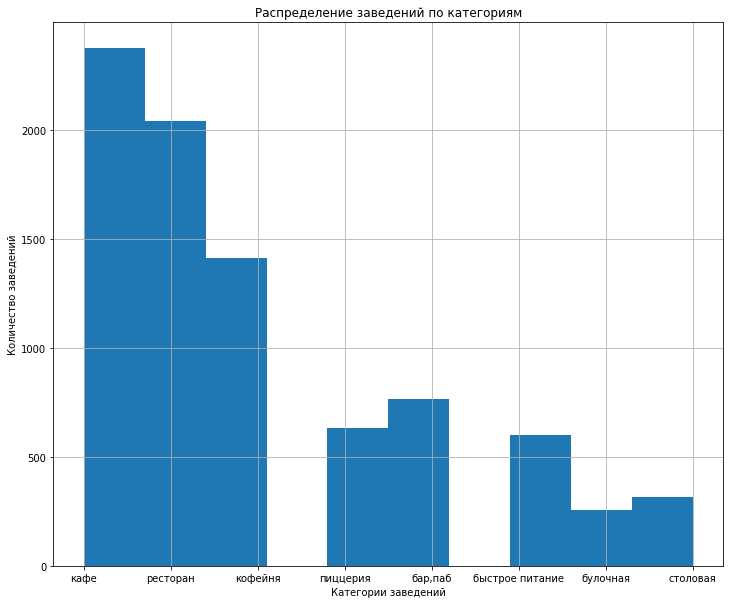

In [13]:
data['category'].hist(figsize=(12, 10))

ax = plt.gca()
fig = plt.gcf()

ax.set_xlabel('Категории заведений')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение заведений по категориям');

### Количество посадочных мест.

**Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.**

Построим столбчатую диаграмму используя столбцы category и seats.

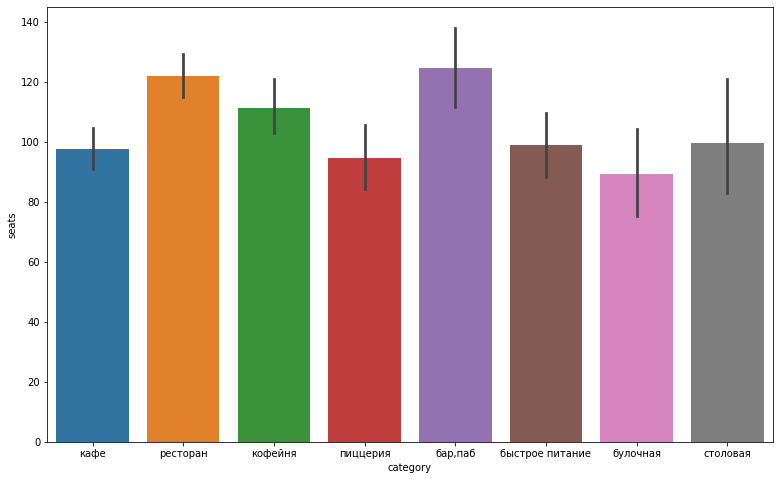

In [14]:
plt.figure(figsize = (13,8))
ax = sns.barplot(x=data['category'],y=data['seats']);

Построим ящик с усами и проанализируем какие выбросы присутствуют в столбце seats.

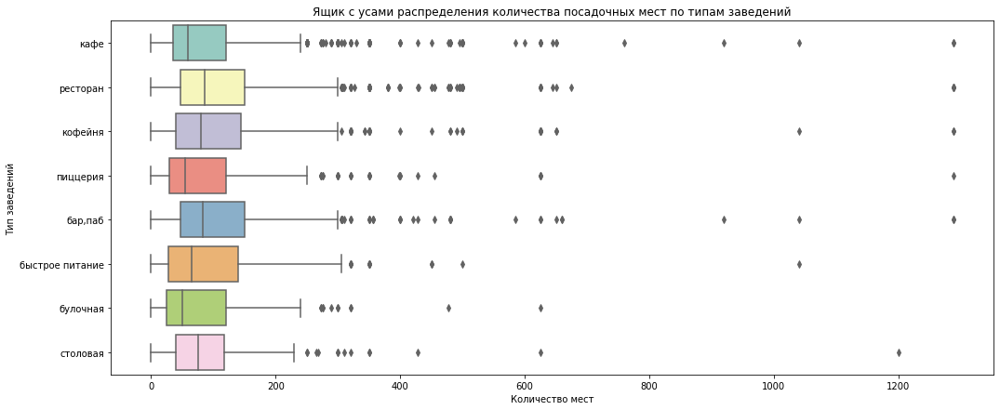

In [15]:
plt.figure(figsize=(17, 7))
ax = sns.boxplot(data=data, x='seats', y='category', palette="Set3")
#ax.set_xlim(-10,300)

plt.title('Ящик с усами распределения количества посадочных мест по типам заведений')
plt.xlabel('Количество мест')
plt.ylabel('Тип заведений')
plt.show()

Вероятно в датасете присутствуют выбросы. Можно предположить что заведения с количеством мест более 600 встречаются крайне редко, даже банкетные залы обычно предполагают меньшее количество мест.

Можно выделить топ 3 категорий заведений по количеству посадочных мест:
- Бар, паб
- Ресторан
- Кофейня

В принципе это не противоречит логике, так как в данные типы заведений люди приходят на несколько часов, нестолько насладиться едой а пообщаться друг с другом и провести качественно досуг. Проходимость в данных местах тоже значительно ниже, чем например в других категориях: быстром питании, столовой и кафе. 

### Анализ сетевых заведений.

**Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?**

Посчитаем количество несетевых и сетевых заведений. Для этого используем метод value_counts() для столбца data['chain'].

In [16]:
chain = data['chain'].value_counts().reset_index()
chain.columns = ['chain', 'count']
chain

,chain,count
0,0,5201
1,1,3205


Количество несетевых заведений - 5201 шт.  
Количество сетевых заведений - 3205 шт.

Визуализируем количество сетевых и несетевых заведений с помощью круговой диаграммы.

In [17]:
fig = go.Figure(data=[go.Pie(labels=['несетевые', 'сетевые'], values=chain['count'])], layout=go.Layout(
        title=go.layout.Title(text="Соотношение сетевых и несетевых заведений")))
fig.show()

38.1% заявлений являются сетевыми, 61.9% не сетевые заявления.

**Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.**

Для ответа на данный вопрос необходимо сделать срез данных по датасету и оставить только заведения, которые являются сетевыми.

In [18]:
data_chain = data.loc[data['chain'] == 1].reset_index(drop=True)
data_chain.sort_values(by='category')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1078,Раковарня Иван Раковар,"бар,паб","Москва, Краснобогатырская улица, 90, стр. 2",Восточный административный округ,"ежедневно, 13:00–23:00",55.801211,37.710070,4.4,NaN,Средний счёт:2500 ₽,2500.0,NaN,1,52.0,Краснобогатырская улица,False
2461,Венахи,"бар,паб","Москва, улица Ленинская Слобода, 19с1",Южный административный округ,"ежедневно, 11:00–00:00",55.708708,37.655379,4.4,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,NaN,улица Ленинская Слобода,False
2463,Филин,"бар,паб","Москва, Автозаводская улица, 13/1",Южный административный округ,"пн-пт 09:00–23:00; сб,вс 10:00–22:00",55.705543,37.655954,4.3,средние,Цена чашки капучино:170–250 ₽,NaN,210.0,1,15.0,Автозаводская улица,False
1509,Нам,"бар,паб","Москва, Саввинская набережная, 19, стр. 1А",Центральный административный округ,"ежедневно, 10:30–21:00",55.734032,37.564268,3.7,NaN,NaN,NaN,NaN,1,45.0,Саввинская набережная,False
1507,Гамбринус,"бар,паб","Москва, Большая Дорогомиловская улица, 4",Западный административный округ,"пн-пт 11:00–00:00; сб,вс 12:00–00:00",55.745837,37.571096,4.6,выше среднего,Средний счёт:1000–1500 ₽,1250.0,NaN,1,NaN,Большая Дорогомиловская улица,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1980,Диана,столовая,"Москва, Большая Татарская улица, 21",Центральный административный округ,"ежедневно, 09:00–23:00",55.739760,37.633489,4.5,средние,Средний счёт:250 ₽,250.0,NaN,1,NaN,Большая Татарская улица,False
2822,Катюша,столовая,"Москва, Коломенский проезд, 13А",Южный административный округ,пн-пт 09:00–15:30,55.665198,37.641027,4.2,NaN,Средний счёт:300 ₽,300.0,NaN,1,NaN,Коломенский проезд,False
1017,Чайхана 24,столовая,"Москва, Никитинская улица, 10Б",Восточный административный округ,"ежедневно, круглосуточно",55.800116,37.776456,4.3,NaN,NaN,NaN,NaN,1,NaN,Никитинская улица,True
2826,Prolunch,столовая,"Москва, Каширское шоссе, 3, корп. 2, стр. 9",Южный административный округ,пн-пт 11:30–16:00,55.672016,37.631631,4.2,средние,Средний счёт:280–350 ₽,315.0,NaN,1,268.0,Каширское шоссе,False


Далее посчитаем количество заведений по категориям с помощью метода value_counts().

In [19]:
data_chain['category'].value_counts()

кафе               779
ресторан           730
кофейня            720
пиццерия           330
быстрое питание    232
бар,паб            169
булочная           157
столовая           88 
Name: category, dtype: int64

Визуализируем полученные данные с помощью гистограммы.

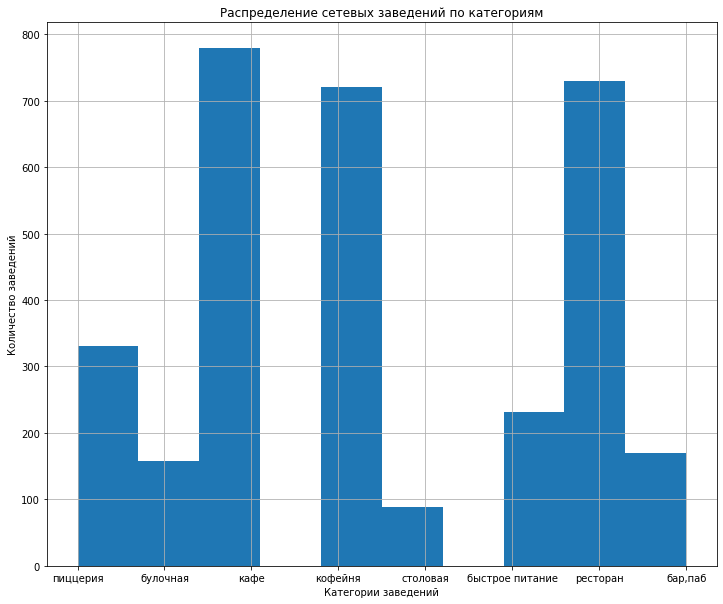

In [20]:
data_chain['category'].hist(figsize=(12, 10))

ax = plt.gca()
fig = plt.gcf()

ax.set_xlabel('Категории заведений')
ax.set_ylabel('Количество заведений')
ax.set_title('Распределение сетевых заведений по категориям');

Чаще всего сетевыми являются следующие категории заведений:
1) Кафе - 779 шт.  
2) Ресторан - 730 шт.  
3) Кофейня - 720 шт.  

### Топ 15 популярных сетей в Москве.

**Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?**

Найдем топ 15 популярных сетей Москвы используя метод agg и groupby для столбцов data['name'] и data['category]. Также посчитаем рейтинг используя медианое значение. 

In [21]:
data_chain = data[data['chain'] == 1]
top_15_places = data_chain.groupby('name').agg({'rating' : 'median', 'category' : pd.Series.mode, 'district' : 'count'})
top_15_places = top_15_places.rename(columns={'district':'count'})
top_15_places = top_15_places.sort_values('count', ascending = False).reset_index().head(15)
top_15_places

,name,rating,category,count
0,Шоколадница,4.20,кофейня,120
1,Домино'с Пицца,4.20,пиццерия,76
2,Додо Пицца,4.30,пиццерия,74
3,One Price Coffee,4.20,кофейня,71
4,Яндекс Лавка,4.00,ресторан,69
5,Cofix,4.10,кофейня,65
6,Prime,4.20,ресторан,50
7,Хинкальная,4.40,кафе,44
8,КОФЕПОРТ,4.20,кофейня,42
9,Кулинарная лавка братьев Караваевых,4.40,кафе,39


Как видно в топе у нас присутствуют довольно популярные заведения такие как: Шоколадница, Домино'c Пицца, Додо Пицца и прочие. Большинство популярных сетей относятся к следующим категориям: кофейня, пиццерия, ресторан.

Отобразим топ-15 сетевых заведений на графике используя метод bar библиотеки plotly express.

In [22]:
fig = px.bar(top_15_places, # загружаем данные и заново их сортируем
             x='count', # указываем столбец с данными для оси X
             y='name', # указываем столбец с данными для оси Y
             text='count', # добавляем аргумент, который отобразит текст с информацией
             color='name'                   # о количестве объявлений внутри столбца графика
            )

fig.update_layout(title='ТОП-15 популярных сетей в Москве',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название заведений',
                   showlegend=False)
fig.show() # выводим график

### Количество заведений в различных административных районах Москвы.

**Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.**

Посчитаем количество заведений в разрезе административных округов. Для этого воспользуемся методом value_counts() для столбца data['district'].

In [23]:
display(data['district'].value_counts())

Центральный административный округ         2242
Северный административный округ            900 
Южный административный округ               892 
Северо-Восточный административный округ    891 
Западный административный округ            851 
Восточный административный округ           798 
Юго-Восточный административный округ       714 
Юго-Западный административный округ        709 
Северо-Западный административный округ     409 
Name: district, dtype: int64

С большим отрывом лидером становится Центральный административный округ. Это логично ведь в центре Москвы сконцентрирована многочисленная бизнес активность, развлекательная и культурно-досуговая инфраструктура, а значит большой трафик людей практически гарантирован.

Теперь посмотрим сколько заведений каждого типа находятся в разных административных районах Москвы. Для этого необходимо воспользоваться агрегирующей функцией agg и методом groupby для столбцов district и category. Выведем на экран первые пять строк получившейся таблицы.

In [24]:
district_category = data.groupby(['district', 'category']).agg({'rating' : 'median', 'name' : 'count'})
district_category = district_category.sort_values('rating', ascending = False).reset_index()
district_category = district_category.rename(columns={'name':'count'})
district_category.head()

,district,category,rating,count
0,Центральный административный округ,"бар,паб",4.5,364
1,Западный административный округ,"бар,паб",4.5,50
2,Северо-Западный административный округ,"бар,паб",4.4,23
3,Центральный административный округ,ресторан,4.4,670
4,Центральный административный округ,пиццерия,4.4,113


Чтобы визуализировать полученную информацию воспользуемся методом px.bar библиотеки plotly express.

In [25]:
fig = px.bar(district_category, # загружаем таблицу с округами
             x='count', # указываем столбец с данными для оси X
             y='district', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# задаем параметры графика
fig.update_layout(title='Количество заведений каждой категории в административном округе',
                   xaxis_title='Количество заведений',
                   yaxis_title='Административный округ',
                   yaxis={'categoryorder':'total ascending'}
                   #font=dict(size=8),
                   #autosize=False,
                   #width=1000,
                   #height=800
                 )
fig.show() # выводим график

Больше всего заведений категорий - ресторан, бар/паб, кафе и кофейня. Данная тенденция характерна практически для всех административных округов.

### Рейтинг заведений.

**Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?**

Для начала необходимо посчитать среднее значение рейтинга для каждого типа заведения. Для этого воспользуемся методом groupby для столбцов 'category' и 'rating'. Далее необходимо применить метод mean(). 

In [26]:
rating_all = round(data.groupby('category')['rating'].mean().reset_index(),2)
rating_all.head(10).sort_values(by='rating')

,category,rating
2,быстрое питание,4.05
3,кафе,4.12
7,столовая,4.21
1,булочная,4.27
4,кофейня,4.28
6,ресторан,4.29
5,пиццерия,4.30
0,"бар,паб",4.39


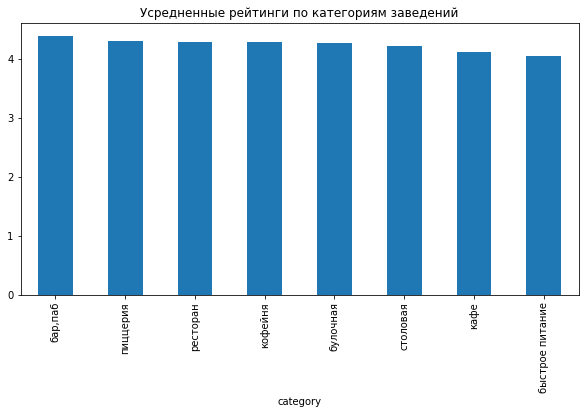

In [27]:
data.groupby('category')['rating'].mean().sort_values(ascending=False).plot(figsize=(10,5),kind="bar",title='Усредненные рейтинги по категориям заведений');

Как видно из таблицы и столбчатой диаграммы - усредненный график заведений не слишком различается и варьируется в диапазоне от 4.05 до 4.38.

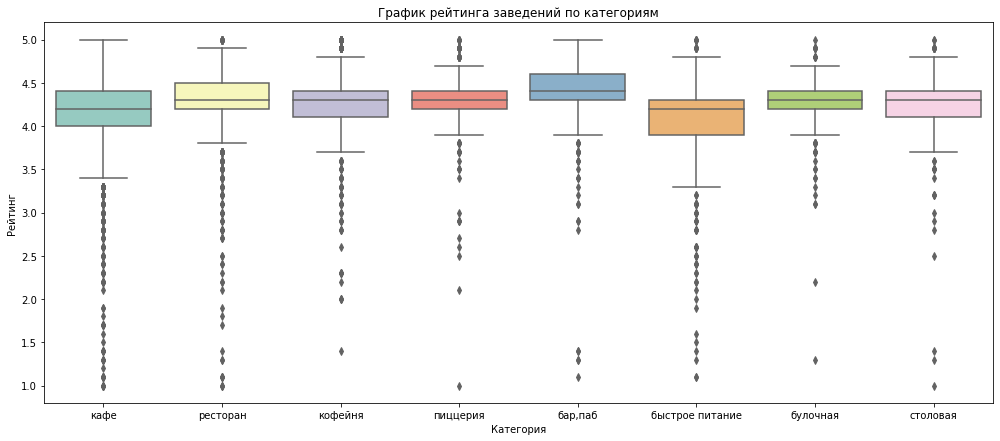

In [28]:
plt.figure(figsize=(17, 7))
ax = sns.boxplot(data=data, x='category', y='rating', palette="Set3")
#ax.set_xlim(-10,300)

plt.title('График рейтинга заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')
plt.show()

На графике видно выбросы - это рейтинг который либо слишком высокий(4.9 и 5.0) либо слишком низкий (менее 3.5)

### Хороплет.

**Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).**

Сгруппируем рейтинг заведений по району и посчитаем среднее значение. Запишем результат в переменную rating_district.

In [29]:
rating_district = round(data.groupby('district')['rating'].mean().reset_index(),2)
rating_district.head(10)

,district,rating
0,Восточный административный округ,4.17
1,Западный административный округ,4.18
2,Северный административный округ,4.24
3,Северо-Восточный административный округ,4.15
4,Северо-Западный административный округ,4.21
5,Центральный административный округ,4.38
6,Юго-Восточный административный округ,4.10
7,Юго-Западный административный округ,4.17
8,Южный административный округ,4.18


In [30]:
# читаем файл и сохраняем в переменной
with open('/datasets/admin_level_geomap.geojson', 'r') as f:
    geo_json = json.load(f)

In [31]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=rating_district,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

**Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.**

In [32]:
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

На карте видно, что большинство заведений сконцентрированы в центрально части столицы. Наименьшее количество заведений на юге Москвы. Вероятно это связано с большим количеством спальных районов.

### Топ-15 улиц по количеству заведений.

**Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.**

In [33]:
data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00–02:00",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False


Для ответа на поставленный вопрос, необходимо применить метод value_counts к столбцу 'street' и отобразить первые 15 значений.

In [34]:
top15_streets_msk = data['street'].value_counts().reset_index().head(15)
top15_streets_msk.columns = ['street_name', 'count']
top15_streets_msk

,street_name,count
0,проспект Мира,184
1,Профсоюзная улица,122
2,проспект Вернадского,108
3,Ленинский проспект,107
4,Ленинградский проспект,95
5,Дмитровское шоссе,88
6,Каширское шоссе,77
7,Варшавское шоссе,76
8,Ленинградское шоссе,70
9,МКАД,65


Как видно лидером по количеству заведений является Проспект Мира - 184 заведения. В конце нашего списка улица Пятницкая - 48 заведений.

Далее создадим таблицу с названиями улиц и категориями заведений расположенных на них. 

In [35]:
streets_places_cat = data.groupby(['street', 'category'])['name'].count().reset_index()
streets_places_cat.columns = ['street_name', 'category', 'count']
streets_places_cat.sort_values('count', ascending=False)

,street_name,category,count
2860,проспект Мира,кафе,53
2863,проспект Мира,ресторан,45
1380,МКАД,кафе,45
2861,проспект Мира,кофейня,36
1989,Профсоюзная улица,кафе,35
...,...,...,...
1531,Моховая улица,"бар,паб",1
1533,Мукомольный проезд,булочная,1
1534,Мукомольный проезд,быстрое питание,1
1535,Мукомольный проезд,пиццерия,1


Чтобы отобразить Топ 15 улиц и категории заведений необходимо воспользоваться методом isin, который выберет строки с нужными нам значениями. 

In [36]:
top_15_streets_cat = streets_places_cat[streets_places_cat['street_name'].isin(top15_streets_msk['street_name'])]

In [37]:
fig = px.bar(top_15_streets_cat, # загружаем список улиц
             x='count', # указываем столбец с данными для оси X
             y='street_name', # указываем столбец с данными для оси Y
             #text='district', # добавляем аргумент, который отобразит текст с информацией
             #barmode='group',                   
             color='category'
            )
# оформляем график
fig.update_layout(title='Топ 15 улиц Москвы по количеству заведений и категориям',
                   xaxis_title='Количество заведений',
                   yaxis_title='Название улиц',
                   yaxis={'categoryorder':'total ascending'}
                   #font=dict(size=7),
                   #autosize=False,
                   #width=1000,
                   #height=800
                 )
fig.show() # выводим график

На первом месте Проспект Мира. Больше всего заведений с категориями - Кафе, ресторан и кофейня. Меньше всего заведений категорий столовая и булочная. На втором месте Профсоюзная улица, категории аналогичные проспекту Мира. В конце нашего списка Пятницкая улица на которой в основном преобладают рестораны. 

**Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?**

Для того чтобы найти улицы с одним объектом общепита, необходимо воспользоваться методом value_counts и сделать срез данных по улицам где находится один объект.

In [38]:
alone_street = data['street'].value_counts().reset_index()
alone_street.columns = ['street_name', 'cafe_count']
alone_street = alone_street[alone_street['cafe_count'] == 1]
alone_street

,street_name,cafe_count
990,улица Петра Романова,1
991,проспект Академика Сахарова,1
992,Большой Сухаревский переулок,1
993,Каланчёвская улица,1
994,Дербеневская улица,1
...,...,...
1443,3-й проезд Подбельского,1
1444,Отрадный проезд,1
1445,Зоологическая улица,1
1446,Борисовская улица,1


Итого в датасете присутствует 458 улиц с одним объектом общепита. Большинство из этих улиц небольшие, и как правило на них расположено какое-либо государственное учреждение: школа, больница или детский сад. 

Далее необходимо добавить категории заведений.

In [39]:
alone_street_cat = streets_places_cat[streets_places_cat['street_name'].isin(alone_street['street_name'])]
alone_street_cat = alone_street_cat.groupby('category')['street_name'].count()
alone_street_cat

category
бар,паб            39 
булочная           8  
быстрое питание    23 
кафе               160
кофейня            84 
пиццерия           15 
ресторан           93 
столовая           36 
Name: street_name, dtype: int64

Больше всего заведений относятся к категории кафе - 160 штук, ресторан - 93 штуки и кофейня - 84 штуки. 

### Анализ уровня цен.

**Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?**

Для ответа на данный вопрос воспользуемся методом groupby для столбцов district и middle_avg_bill. И посчитаем медиану методом median().

In [40]:
median_bill_district = data.groupby('district')['middle_avg_bill'].median().reset_index()
median_bill_district.sort_values('middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


Отобразим полученные данные на карте Москвы.

In [41]:
# создаём карту Москвы
m_2 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=median_bill_district,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний чек заведений по районам',
).add_to(m_2)

# выводим карту
m_2

Самый высокий средний чек в Центральном и Западном административных округах - 1000 руб. Самый низкий в Юго-Восточном административном округе - 450 руб.

### Общий вывод по разделу.

В датасете представлено 8406 заведений из которых топ-3 категории:

- Кафе 2378 шт;
- Ресторан 2043 шт;
- Кофейня 1413 шт.

Больше всего посадочных мест в Барах/пабах, ресторанах и кофейнях. Это логично, так как в данные заведения люди приходят не только поесть но и пообщаться с друзьями, родственниками и хорошо провести время. 

Количество несетевых заведений больше чем сетевых: 5201 шт. против 3205 шт. Больше всего сетевых заведений в категориях:

- Кафе 779 шт;
- Ресторан 730 шт;  
- Кофейня 720 шт.

В топе сетевых заведений такие бренды как: 
- Шоколадница (119 шт.), 
- Домино'c Пицца (76 шт.)
- Додо Пицца (74 шт.) 

Большинство популярных сетей относятся к следующим категориям: кофейня, пиццерия, ресторан.

В разрезе географии с большим отрывом лидером становится Центральный административный округ (2242 шт.) Это логично ведь в центре Москвы сконцентрирована многочисленная бизнес активность, развлекательная и культурно-досуговая инфраструктура, а значит большой трафик людей практически гарантирован. 

Усредненный рейтинг заведений не слишком различается в зависимости от их типа и варьируется в диапазоне от 4.05 до 4.38.

Лидером по количеству заведений является Проспект Мира - 184 заведения. В конце нашего списка улица Пятницкая - 48 заведений.

Самый высокий средний чек в Центральном и Западном административных округах - 1000 руб. Самый низкий в Юго-Восточном административном округе - 450 руб.

## Исследование данных для открытия кофейни.

**Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.  
Ответьте на следующие вопросы:**  

**- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?**  
**- Есть ли круглосуточные кофейни?**    
**- Какие у кофеен рейтинги? Как они распределяются по районам?**    
**- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?**  

Приступим к ответу на поставленные вопросы. Для начала необходимо определить сколько всего кофеен в датасете.

In [42]:
total_coffee = data[data['category'] == 'кофейня']
print('Общее количество кофеен в Москве:', total_coffee.shape[0])

Общее количество кофеен в Москве: 1413


Отобразим все кофейни на карте.

In [43]:
# создаём карту Москвы
m_3 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_3)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
total_coffee.apply(create_clusters, axis=1)

# выводим карту
m_3

Больше всего кофеен в центральном административном округе - 409 шт. Меньше всего в южном административном округе - 23 шт.

Теперь определим есть ли круглосуточные кофейни.

In [44]:
coffee_24_7 = total_coffee[total_coffee['is_24/7'] == True]
print('Всего круглосуточных кофеен:', coffee_24_7.shape[0])

Всего круглосуточных кофеен: 76


Посмотрим в каких районах расположены данные кофейни.

In [45]:
# создаём карту Москвы
m_4 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m_4)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
coffee_24_7.apply(create_clusters, axis=1)

# выводим карту
m_4

Больше всего круглосуточных кофеен в центральном административном округе. Меньше всего в южном и северном административным округах. 

Далее определим рейтинги кофеен. 

In [46]:
coffee_rate = total_coffee.groupby('district', as_index=False)['rating'].agg('mean').round(2).sort_values('rating', ascending=False)
coffee_rate

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
0,Восточный административный округ,4.28
7,Юго-Западный административный округ,4.28
6,Юго-Восточный административный округ,4.23
8,Южный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


Отобразим полученные данные на карте.

In [47]:
# создаём карту Москвы
m_5 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_rate,
    columns=['district', 'rating'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m_5)

# выводим карту
m_5

Самый высокий рейтинг у кофеен в центральном административном округе - 4.34, Северо-Западном административном округе - 4.33. Самый низкий рейтинг в Западном административном округе - 4.20 и Северо-Восточном административном округе - 4.22

Определим среднюю стоимость чашки капучино.

In [48]:
coffee_price = total_coffee.groupby('district', as_index=False)['middle_coffee_cup'].agg('mean').round(2).sort_values('middle_coffee_cup', ascending=False)
display(coffee_price)
print('Средняя стоимость чашки кофе в Москве:', coffee_price['middle_coffee_cup'].mean().round(2))

,district,middle_coffee_cup
1,Западный административный округ,189.94
5,Центральный административный округ,187.52
7,Юго-Западный административный округ,184.18
0,Восточный административный округ,174.02
2,Северный административный округ,165.79
4,Северо-Западный административный округ,165.52
3,Северо-Восточный административный округ,165.33
8,Южный административный округ,158.49
6,Юго-Восточный административный округ,151.09


Средняя стоимость чашки кофе в Москве: 171.32


Отобразим полученные данные на карте.

In [49]:
# создаём карту Москвы
m_6 = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=coffee_price,
    columns=['district', 'middle_coffee_cup'],
    key_on='feature.name',
    #fill_color='YlGn',
    #fill_opacity=0.8,
    legend_name='Средняя стоимость чашки кофе по округам',
).add_to(m_6)

# выводим карту
m_6

Средняя стоимость чашки кофе выше всего в Западном административном округе - 189.94 руб. Центральном административном округе - 187.52 руб. Юго-Западном административном округе - 184.18 руб.   
Меньше всего в Юго-Восточном административном округе - 151.09 руб и в Южном административном округе - 158.49 руб.

### Рекомендации по результатам исследования.

При открытии кофейни стоит ориентироваться на местоположение:

- Больше всего конкуренция в Центральном административном округе, меньше всего в Южном административном округе;
- Круглосуточных кофеен всего 76 штук. Логично сделать кофейню круглосуточной и получить преимущество над конкурентами, но следует учитывать и затраты на непрерывную работу кофейни;
- При выборе стоимости чашки кофе стоит ориентироваться на среднюю стоимость по каждому району. Можно использовать цену на уровне или ниже средней по району, в качестве демпинговой тактики проникновения на рынок. 
- Оценка среднего рейтинга кофеен по округам, позволит выбрать местоположение для открытия заведения. Можно сделать упор на качественный сервис и раскрутку рейтинга, чтобы превзойти конкурентов.